In [4]:
import pm4py

file_path = '../data/BPI_Challenge_2019-3-w-after.xes'

print(f"🔄 Loading event log from: {file_path}")
log = pm4py.read_xes(file_path)
print(f"✅ Log loaded successfully with {len(log)} cases (traces).")

# simple directly-follow-graph
dfg, start_activities, end_activities = pm4py.discover_dfg(log)

print("🎨 Generating and displaying the process map...")
pm4py.view_dfg(dfg, start_activities, end_activities)

🔄 Loading event log from: ../data/BPI_Challenge_2019-3-w-after.xes


/Users/I569362/dev/is515-case-group1/.venv/lib/python3.12/site-packages/pm4py/utils.py:986: UserWarning: In the current version, the import/export operation uses `rustxes` by default for importing/exporting files faster. Please uninstall `rustxes` to revert the behavior.
  warnings.warn("In the current version, the import/export operation uses `rustxes` by default for importing/exporting files faster. Please uninstall `rustxes` to revert the behavior.")


✅ Log loaded successfully with 319233 cases (traces).
🎨 Generating and displaying the process map...


-> dfg is a mess / spaghetti process

-> use heuristic miner to get a better overview


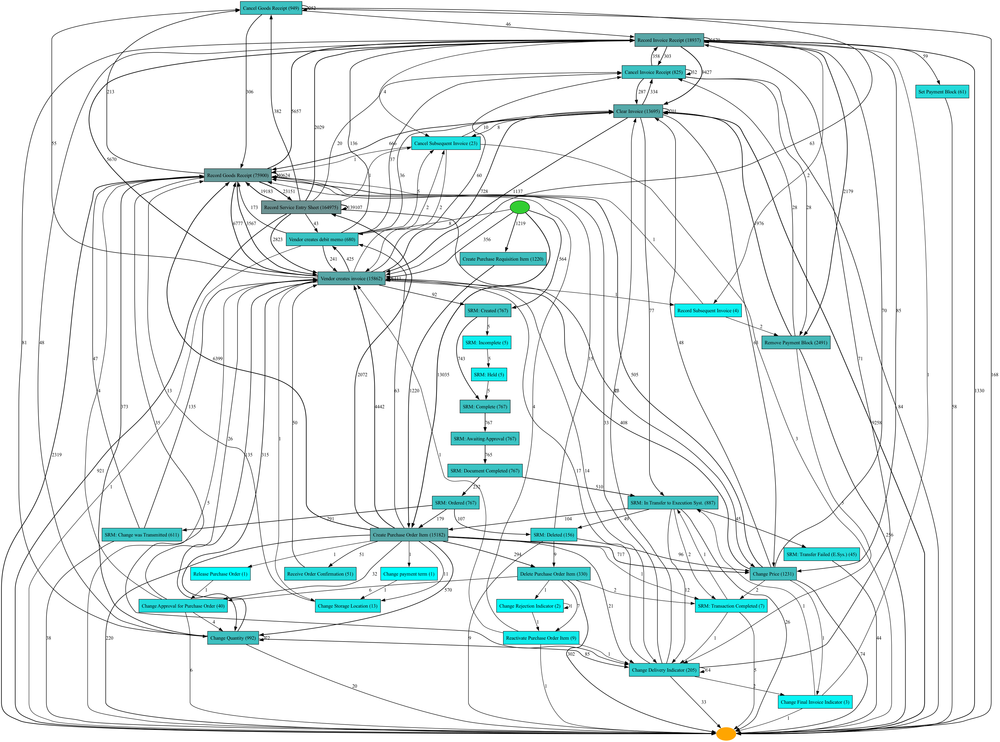

In [65]:
map = pm4py.discover_heuristics_net(log)
pm4py.view_heuristics_net(map)


Still hard to read.

Use Inductive Miner algorithm to generate process tree / bpmn

In [13]:
# inductive miner
process_tree = pm4py.discover_process_tree_inductive(log)

bpmn_model = pm4py.convert_to_bpmn(process_tree)

pm4py.view_bpmn(bpmn_model)

Default BPNM using inductive miner algorithm is not suitable

it has

- high fitness

but poor

- generalization
- simplicity

Inductive Miner (by default) tries to account for every single pathway in data

-> use noise-threshold to ignore least frequent paths


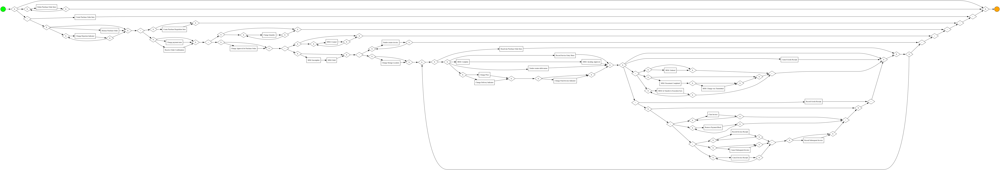

In [22]:
bpmn_model = pm4py.discover_bpmn_inductive(log, noise_threshold=0.4)

pm4py.view_bpmn(bpmn_model)

still complex, reduce amount of cases by filtering event data directly and trying again

Log 1 (after cleaning): 15182 cases
Log 2 (after start/end activity filtering): 13098 cases
Log 3 (after variant coverage filtering): 3715 cases


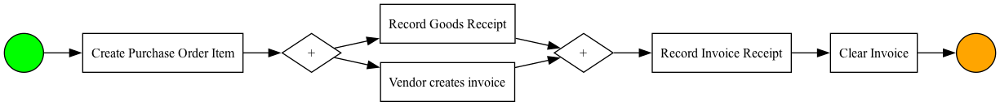

In [ ]:
import pm4py
from pm4py.algo.filtering.log.start_activities import start_activities_filter as sa
from pm4py.algo.filtering.log.end_activities import end_activities_filter as ea
from pm4py.algo.filtering.log.variants import variants_filter

"""
NOTE: This is commented out because 100% of the events in the log have their lifecycle:transition set to complete
"""
# 0) only keep complete events
# df = pm4py.convert_to_dataframe(log)
# if "lifecycle:transition" in df.columns:
#     df = df[df["lifecycle:transition"].str.lower() == "complete"]
# log1 = pm4py.convert_to_event_log(df)


# 1) Keep dominant start/end activities
sa_counts = pm4py.get_start_activities(log)
ea_counts = pm4py.get_end_activities(log)
min_rel = 0.05 # need to be start/end activities for >= 5% of the time
n_cases = len(log)
allowed_sa = [a for a, c in sa_counts.items() if c >= min_rel * n_cases]
allowed_ea = [a for a, c in ea_counts.items() if c >= min_rel * n_cases]

log2 = sa.apply(log, allowed_sa)
log2 = ea.apply(log2, allowed_ea)

# 2) Keep frequent variants until 10% coverage
log3 = variants_filter.filter_variants_by_coverage_percentage(log2, 0.1)

# 3) Discover with Inductive Miner (BPMN)
tree = pm4py.discover_process_tree_inductive(log3, noise_threshold=0.60)
bpmn_im = pm4py.convert_to_bpmn(tree)


#print("Log 1 (after cleaning):", len(log1), "cases")
print("Log 2 (after start/end activity filtering):", len(log2), "cases")
print("Log 3 (after variant coverage filtering):", len(log3), "cases")

pm4py.view_bpmn(bpmn_im)


This BPMN shows the basic version of this process. 
1. purchase order item gets created
2. In parallel, the goods receipt is recorded and the vendor creates the invoice
3. After that, the invoice receipt is recorded
5. The incoice is cleared

While this shows the "happy path", some information is lost by not showing alternative paths

-> of the 38 original activities, only 5 are left. 
- Around 2000 cases are filtered when cleaning up start and end activities.
- Around 9000 cases are filtered after variant coverage filtering

In [ ]:
# Analyze start activities

start_activities = pm4py.get_start_activities(log)
print(start_activities)

{'SRM: Created': 564, 'Vendor creates invoice': 356, 'Vendor creates debit memo': 8, 'Create Purchase Order Item': 13035, 'Create Purchase Requisition Item': 1219}


most common start activities after `Create Purchase Order Item` are `Create Purchase Requisition Item` with 1219 entries and `SRM: Created` with 564 entries


When looking at the output from the heuristic miner, we can see that `Create Purchase Requisition Item` is sometimes done before `Create Purchase Order Item`(1219 times, which corresponds to the amount of times it is a start activity). Overall, this activity doesn't really add insight into our process model

SRM = Supplier Relationship Management

When looking at `SRM:Created` within the heruistic miner output, we can analyze the flow as follows

1. Main Process Path

    The primary flow starting with `SRM:Created` appears to follow this sequence:

    `SRM:Created` → `SRM:Complete` → `SRM:Awaiting Approval` → `SRM:Document Completed`

    Following `SRM:Document Completed`, the process typically branches to one of two activities:

    - `SRM:Ordered`

    - `SRM:In transfer to execution system`

2. Alternative and Subsequent Paths

    - Early Deviations: A rare path (5 cases) exists where `SRM:Created` first goes to `SRM:Incomplete` then to `SRM:Held` before continuing to `SRM:Complete`.

    - Paths from `SRM:Ordered`: After the `SRM:Ordered` step, the process is sometimes followed by:

        - `SRM:Change was transmitted`

        - `SRM:Change was deleted`

    - Paths from `SRM:In transfer to execution sytem`: After `SRM:In transfer to execution system`, the process can be followed by:

        - `SRM:Transfer failed`

        - `SRM:Deleted`

        - `SRM:Transaction Completed`




When filtering out `SRM:Created` as a start activity, it follows `Vendor Created invoice` 47 times

But there are 564 cases which start with the activity `SRM:Created`

### => Cases that start with `SRM:Created` are a self-contained process in our event log data
### => Analyze Subprocess


SRM activities found: ['SRM: In Transfer to Execution Syst.', 'SRM: Complete', 'SRM: Created', 'SRM: Document Completed', 'SRM: Awaiting Approval', 'SRM: Ordered', 'SRM: Change was Transmitted', 'SRM: Deleted', 'SRM: Transfer Failed (E.Sys.)', 'SRM: Transaction Completed', 'SRM: Incomplete', 'SRM: Held']


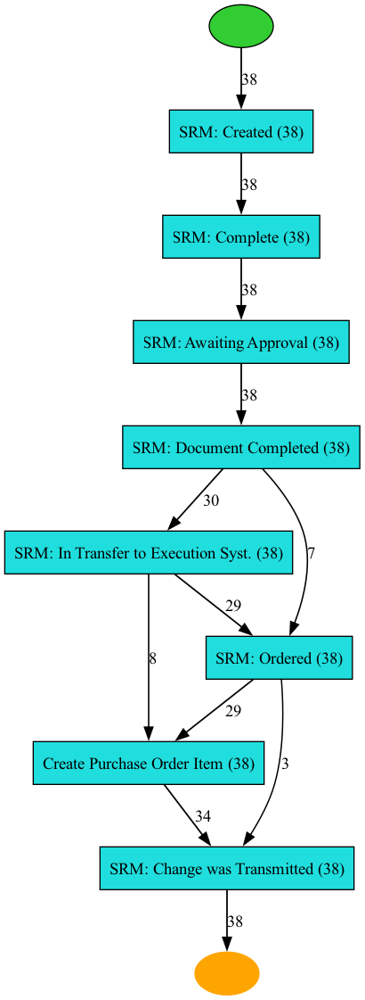

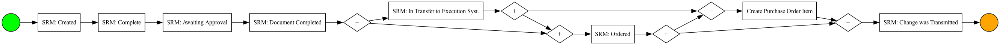

In [84]:
from pm4py.algo.filtering.log.end_activities import end_activities_filter

all_activities = pm4py.get_event_attribute_values(log, "concept:name")
srm_activities = [act for act, count in all_activities.items() if 'SRM' in act] # Fetch all activities which contain 'SRM' Substring
print("SRM activities found:", srm_activities)

filtered_log = pm4py.filter_event_attribute_values(
    log, 
    "concept:name", 
    srm_activities, 
    retain=True,  
    level="event"
)

# Keep dominant start/end activities
sa_counts = pm4py.get_start_activities(filtered_log)
ea_counts = pm4py.get_end_activities(filtered_log)
min_rel = 0.015
n_cases = len(filtered_log)
allowed_sa = [a for a, c in sa_counts.items() if c >= min_rel * n_cases]
allowed_ea = [a for a, c in ea_counts.items() if c >= min_rel * n_cases]

log2 = sa.apply(log, allowed_sa)
log2 = ea.apply(log2, allowed_ea)

map = pm4py.discover_heuristics_net(log2)
bpmn_model = pm4py.convert_to_bpmn(map)

pm4py.view_heuristics_net(map)
pm4py.view_bpmn(bpmn_model)



### After cleaning up the created BPMN, this is the mined sub-process

TODO: Adjust BPMN to follow best practices

Note that `SRM: Incomplete` and `SRM: Held` are included to also include deviations. Create Purchase Order Item was removed because it runs in parallel in 3-way process

`SRM: Deleted` and `SRM: Transfer Failed (E.Sys.)` are excluded from the BPMN, since the process map shows no clear mechanism on what to do after a transfer failed (the case just ends). For this, a conversation with a domain expert would be neccessary.

<div style="background-color: white; display: inline-block;">
    <img src="../images/srm-sub-process.svg" width="1000"/>
</div>



`Record Goods Receipt` and `Record Service Entry Sheet` are missing, despite being the most frequent activities.

=> analyze when they are executed in the process

In [2]:
def find_preceeding(target_activity):
    preceding_activities = {}

    for (source, target), count in dfg.items():
        if target == target_activity:
            preceding_activities[source] = count

    print(f"Activities that occur directly before '{target_activity}':")
    if preceding_activities:
        # Sort by frequency in descending order
        sorted_activities = sorted(preceding_activities.items(), key=lambda item: item[1], reverse=True)
        for activity, count in sorted_activities:
            print(f"- {activity}: {count} times")
    else:
        print(f"No activities found directly before '{target_activity}'.")

In [10]:
find_preceeding('Record Goods Receipt')

Activities that occur directly before 'Record Goods Receipt':
- Record Goods Receipt: 40624 times
- Record Service Entry Sheet: 19183 times
- Vendor creates invoice: 6777 times
- Create Purchase Order Item: 6399 times
- Record Invoice Receipt: 707 times
- Clear Invoice: 666 times
- Change Price: 505 times
- Change Quantity: 373 times
- Cancel Goods Receipt: 306 times
- Vendor creates debit memo: 173 times
- SRM: Change was Transmitted: 47 times
- Remove Payment Block: 37 times
- Change Delivery Indicator: 33 times
- SRM: Deleted: 15 times
- SRM: In Transfer to Execution Syst.: 15 times
- Change Storage Location: 13 times
- Cancel Invoice Receipt: 12 times
- SRM: Created: 5 times
- Change Approval for Purchase Order: 4 times
- Reactivate Purchase Order Item: 4 times
- Cancel Subsequent Invoice: 1 times
- Record Subsequent Invoice: 1 times


- Record Gods Receipt points to iteself 40k times. Possible Loop
- After Record Service Entry Sheet almost 20k times
- Then steep drop
- Vendor creates invoice: 6777
- Create Purchase Order Item: 6399

In [9]:
find_preceeding('Record Service Entry Sheet')

Activities that occur directly before 'Record Service Entry Sheet':
- Record Service Entry Sheet: 139107 times
- Record Goods Receipt: 23151 times
- Create Purchase Order Item: 2072 times
- Vendor creates invoice: 351 times
- Clear Invoice: 114 times
- Cancel Goods Receipt: 71 times
- Record Invoice Receipt: 57 times
- Change Price: 24 times
- Remove Payment Block: 7 times
- SRM: Change was Transmitted: 7 times
- Vendor creates debit memo: 7 times
- SRM: Created: 3 times
- SRM: Deleted: 2 times
- Cancel Invoice Receipt: 1 times
- SRM: In Transfer to Execution Syst.: 1 times


- as with record goods receipt, comes after itself for 140k times.
- then comes before record goods receipt 23151 times
- => since both follow each other, they probably run in parallel
- => need to find a common ancestor


>Definition Service Entry Sheet:
>
>A Service Entry Sheet is a document that contains details of services that have been performed by the Supplier based on the terms of a Purchase Order.


>Definition Goods Receipt: 
>
>Goods receipt is the physical acceptance of goods or materials into stock.

Case Study does not tell much about services / materials that are delivered
=> Service Entry Sheet appears to be optional? But both run in parallel

In Both cases `Create Purchse Order Item` or `Vendor creates invoice` appears to be the common ancestor

=> Appears to run in parallel

<div style="background-color: white; display: inline-block;">
    <img src="../images/process.svg" width="1000"/>
</div>


In [5]:
find_preceeding('Record Invoice Receipt')

Activities that occur directly before 'Record Invoice Receipt':
- Vendor creates invoice: 5670 times
- Record Goods Receipt: 5657 times
- Record Invoice Receipt: 3579 times
- Record Service Entry Sheet: 2029 times
- Clear Invoice: 1127 times
- Cancel Invoice Receipt: 358 times
- Vendor creates debit memo: 136 times
- Remove Payment Block: 102 times
- Change Quantity: 81 times
- Change Delivery Indicator: 71 times
- Change Price: 70 times
- Cancel Goods Receipt: 46 times
- SRM: Deleted: 4 times
- SRM: Document Completed: 4 times
- Cancel Subsequent Invoice: 1 times
- Change Final Invoice Indicator: 1 times
- SRM: In Transfer to Execution Syst.: 1 times


In [ ]:
# Analyze end activities

end_activities = pm4py.get_end_activities(log)
print(end_activities)

{'SRM: Transfer Failed (E.Sys.)': 44, 'SRM: Change was Transmitted': 38, 'Change Delivery Indicator': 33, 'Clear Invoice': 9258, 'SRM: In Transfer to Execution Syst.': 26, 'Record Service Entry Sheet': 921, 'Create Purchase Order Item': 220, 'Record Invoice Receipt': 1330, 'Vendor creates debit memo': 1, 'Change Final Invoice Indicator': 1, 'SRM: Transaction Completed': 5, 'Remove Payment Block': 256, 'Cancel Invoice Receipt': 84, 'Change Price': 74, 'Delete Purchase Order Item': 302, 'Set Payment Block': 58, 'Record Goods Receipt': 2319, 'Cancel Goods Receipt': 168, 'Cancel Subsequent Invoice': 3, 'Vendor creates invoice': 5, 'SRM: Deleted': 9, 'Reactivate Purchase Order Item': 1, 'Change Quantity': 20, 'Change Approval for Purchase Order': 6}
